In [2]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [3]:
import tensorflow
print(tensorflow.__version__)

1.15.2


In [7]:
!nvidia-smi -L

GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-08635405-3548-70cb-9062-7b093a71a175)


In [8]:
!git clone https://github.com/matterport/Mask_RCNN.git

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 116.76 MiB | 39.78 MiB/s, done.
Resolving deltas: 100% (567/567), done.


In [9]:
%cd /content/Mask_RCNN/

/content/Mask_RCNN


In [10]:
!pwd

/content/Mask_RCNN


In [11]:
!python setup.py install

running install
running bdist_egg
running egg_info
creating mask_rcnn.egg-info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_links to mask_rcnn.egg-info/dependency_links.txt
writing top-level names to mask_rcnn.egg-info/top_level.txt
writing manifest file 'mask_rcnn.egg-info/SOURCES.txt'
reading manifest template 'MANIFEST.in'
writing manifest file 'mask_rcnn.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
creating build
creating build/lib
creating build/lib/mrcnn
copying mrcnn/model.py -> build/lib/mrcnn
copying mrcnn/config.py -> build/lib/mrcnn
copying mrcnn/parallel_model.py -> build/lib/mrcnn
copying mrcnn/visualize.py -> build/lib/mrcnn
copying mrcnn/utils.py -> build/lib/mrcnn
copying mrcnn/__init__.py -> build/lib/mrcnn
creating build/bdist.linux-x86_64
creating build/bdist.linux-x86_64/egg
creating build/bdist.linux-x86_64/egg/mrcnn
copying build/lib/mrcnn/model.py -> build/bdist.linux-x86_64/egg/mrcnn

In [12]:
pip show mask-rcnn

Name: mask-rcnn
Version: 2.1
Summary: Mask R-CNN for object detection and instance segmentation
Home-page: https://github.com/matterport/Mask_RCNN
Author: Matterport
Author-email: waleed.abdulla@gmail.com
License: MIT
Location: /usr/local/lib/python3.6/dist-packages/mask_rcnn-2.1-py3.6.egg
Requires: 
Required-by: 


In [13]:
!pip install git+https://github.com/aleju/imgaug.git

  Cloning https://github.com/aleju/imgaug.git to /tmp/pip-req-build-99hf3qsb
  Running command git clone -q https://github.com/aleju/imgaug.git /tmp/pip-req-build-99hf3qsb
  Created wheel for imgaug: filename=imgaug-0.4.0-cp36-none-any.whl size=971107 sha256=03ca6ab6425f92d4a1c2323d76fdb3c4e9a0684ad94471cc6e5669018550e7d9
  Stored in directory: /tmp/pip-ephem-wheel-cache-1h2ds65k/wheels/65/3d/94/ee32cbeaa29c473a4db74c2d21904ac747311fdca4732665f0
Successfully built imgaug
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.4.0 which is incompatible.
  Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9


In [0]:
#!pip install tensorflow==1.14.0
#!pip install tensorflow==1.4.0
#import tensorflow as tf
#print(tf.__version__)

     |████████████████████████████████| 41.2MB 73kB/s 
     |████████████████████████████████| 1.7MB 62.9MB/s 
  Found existing installation: tensorflow-tensorboard 1.5.1
    Uninstalling tensorflow-tensorboard-1.5.1:
      Successfully uninstalled tensorflow-tensorboard-1.5.1
  Found existing installation: tensorflow 1.5.0
    Uninstalling tensorflow-1.5.0:
      Successfully uninstalled tensorflow-1.5.0


In [14]:
!pip3 install keras==2.2.5

     |████████████████████████████████| 337kB 4.6MB/s 
  Found existing installation: Keras 2.3.1
    Uninstalling Keras-2.3.1:
      Successfully uninstalled Keras-2.3.1


In [15]:
import numpy as np 
import pandas as pd 
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
import sys, os, random, glob, cv2, math

from mrcnn import utils
from mrcnn.model import log
from mrcnn import visualize
import mrcnn.model as modellib
from mrcnn.config import Config


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
Using TensorFlow backend.


In [0]:
ORIG_SIZE     = 1024
epoch         = 50
data_root     = '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/Models'
packages_root = '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/Models'

In [0]:
import pandas, numpy
import pandas as pd 
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
# code to read csv file into Colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)
# filter warnings on depreciation etc.
import warnings 
warnings.filterwarnings("ignore")

In [18]:
# load clean data set
link = 'https://drive.google.com/file/d/1kktM_D2NhWnTLljI_0i_Wv_xNm9KKeup/view?usp=sharing' # The shareable link
#fluff, id = link.split('=')
downloaded = drive.CreateFile({'id':'1kktM_D2NhWnTLljI_0i_Wv_xNm9KKeup'}) 
downloaded.GetContentFile('Filename.csv')  
df = pd.read_csv('Filename.csv')
# Dataset is now stored in a Pandas Dataframe
df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


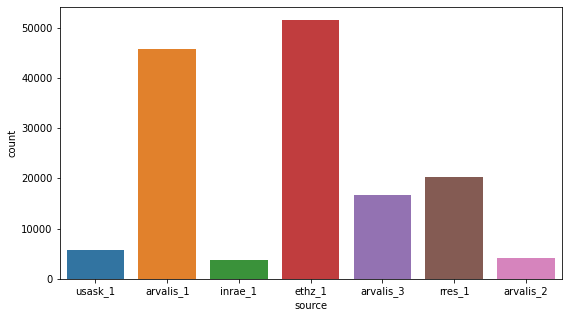

In [19]:
plt.figure(figsize=(9,5))
sns.countplot(df.source)
plt.show()

In [20]:
img_root = '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/train'
len(os.listdir(img_root)) - len(df.image_id.unique())

49

In [21]:
df['bbox'] = df['bbox'].apply(lambda x: x[1:-1].split(","))

df['x'] = df['bbox'].apply(lambda x: x[0]).astype('float32')
df['y'] = df['bbox'].apply(lambda x: x[1]).astype('float32')
df['w'] = df['bbox'].apply(lambda x: x[2]).astype('float32')
df['h'] = df['bbox'].apply(lambda x: x[3]).astype('float32')

df = df[['image_id','x', 'y', 'w', 'h']]
df.head()

,image_id,x,y,w,h
0,b6ab77fd7,834.0,222.0,56.0,36.0
1,b6ab77fd7,226.0,548.0,130.0,58.0
2,b6ab77fd7,377.0,504.0,74.0,160.0
3,b6ab77fd7,834.0,95.0,109.0,107.0
4,b6ab77fd7,26.0,144.0,124.0,117.0


In [22]:
class WheatDetectorConfig(Config):
    # Give the configuration a recognizable name  
    NAME = 'wheat'
    
    # set the number of GPUs to use along with the number of images
    # per GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2
    BACKBONE = 'resnet101'
    
    # number of classes (we would normally add +1 for the background)
    # BG + Wheat
    NUM_CLASSES = 2
    
    IMAGE_RESIZE_MODE = "square"
    IMAGE_MIN_DIM = 1024
    IMAGE_MAX_DIM = 1024
    
    # Number of training steps per epoch
    STEPS_PER_EPOCH = 120
    
    # Use different size anchors because our target objects are multi-scale (wheats are some too big, some too small)
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)  # anchor side in pixels
    
    # Learning rate
    LEARNING_RATE = 0.005
    WEIGHT_DECAY  = 0.0005
    
    # Maximum number of ROI’s, the Region Proposal Network (RPN) will generate for the image
    TRAIN_ROIS_PER_IMAGE = 350 
    
    # Skip detections with < 60% confidence
    DETECTION_MIN_CONFIDENCE = 0.60
    
    # Increase with larger training
    VALIDATION_STEPS = 60
    
    # Maximum number of instances that can be detected in one image.
    MAX_GT_INSTANCES = 500 # 200 
 
    # Loss weights for more precise optimization.
    # Can be used for R-CNN training setup.
    LOSS_WEIGHTS = {
        "rpn_class_loss": 1.0,
        "rpn_bbox_loss": 1.0,
        "mrcnn_class_loss": 1.0,
        "mrcnn_bbox_loss": 1.0,
        "mrcnn_mask_loss": 1.0
        }

config = WheatDetectorConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.6
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  1024
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.005
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE        

In [0]:
def get_jpg(img_dir, anns):
    '''
    input:
        img_dir: image directory of the train sets
        anns: specified image ids for train or validation
    return:
        img files with specified image ids
    '''
    id      = []
    jpg_fps = []

    for index, row in anns.iterrows():
        id.append(row['image_id'])

    for i in os.listdir(img_dir):
        if os.path.splitext(i)[0] not in id:
            continue
        else:
            jpg_fps.append(os.path.join(img_dir, i))

    return list(set(jpg_fps))

def get_dataset(img_dir, anns): 
    image_fps = get_jpg(img_dir, anns)

    image_annotations = {fp: [] for fp in image_fps}

    for index, row in anns.iterrows(): 
        fp = os.path.join(img_dir, row['image_id'] + '.jpg')
        image_annotations[fp].append(row)

    return image_fps, image_annotations 

In [0]:
class DetectorDataset(utils.Dataset):
    def __init__(self, image_fps, image_annotations, orig_height, orig_width):
        super().__init__(self)
        
        # Add classes
        self.add_class('GlobalWheat', 1 , 'Wheat') # only one class, wheat
        
        # add images 
        for id, fp in enumerate(image_fps):
            annotations = image_annotations[fp]
            self.add_image('GlobalWheat', image_id=id, 
                           path=fp, annotations=annotations, 
                           orig_height=orig_height, orig_width=orig_width)

    # load bbox, most important function so far        
    def load_mask(self, image_id):
        info = self.image_info[image_id]
        annotations = info['annotations']
        count = len(annotations)
    
        if count == 0:
            mask = np.zeros((info['orig_height'], info['orig_width'], 1), 
                            dtype=np.uint8)
            class_ids = np.zeros((1,), dtype=np.int32)
        else:
            mask = np.zeros((info['orig_height'], info['orig_width'], count),
                            dtype=np.uint8)
            class_ids = np.zeros((count,), dtype=np.int32)
            for i, a in enumerate(annotations):
                x = int(a['x'])
                y = int(a['y'])
                w = int(a['w'])
                h = int(a['h'])
                mask_instance = mask[:, :, i].copy()
                cv2.rectangle(mask_instance, (x, y), (x+w, y+h), 255, -1)
                mask[:, :, i] = mask_instance
                class_ids[i] = 1
        return mask.astype(np.bool), class_ids.astype(np.int32)
    
    # simple image loader 
    def load_image(self, image_id):
        info = self.image_info[image_id]
        fp = info['path']
        image = cv2.imread(fp, cv2.IMREAD_COLOR)
        # If grayscale. Convert to RGB for consistency.
        if len(image.shape) != 3 or image.shape[2] != 3:
            image = np.stack((image,) * 3, -1)
        return image
    
    # simply return the image path
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

In [25]:
image_ids = df['image_id'].unique()

valid_ids = image_ids[-700:]
train_ids = image_ids[:-700]

valid_df = df[df['image_id'].isin(valid_ids)]
train_df = df[df['image_id'].isin(train_ids)]
train_df.shape, valid_df.shape

((122106, 5), (25687, 5))

In [26]:
# grab all image file path with concern annotation
train_image_fps, train_image_annotations = get_dataset(img_root,
                                                       anns=train_df)

# make data generator with that
dataset_train = DetectorDataset(train_image_fps, 
                                train_image_annotations,
                                ORIG_SIZE, ORIG_SIZE)

dataset_train.prepare()

print("Class Count: {}".format(dataset_train.num_classes))
for i, info in enumerate(dataset_train.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Class Count: 2
  0. BG                                                
  1. Wheat                                             


In [27]:
# grab all image file path with concern annotation
valid_image_fps, valid_image_annotations = get_dataset(img_root, 
                                           anns=valid_df)

# make data generator with that
dataset_valid = DetectorDataset(valid_image_fps, valid_image_annotations,
                                ORIG_SIZE, ORIG_SIZE)
dataset_valid.prepare()

print("Class Count: {}".format(dataset_valid.num_classes))
for i, info in enumerate(dataset_valid.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Class Count: 2
  0. BG                                                
  1. Wheat                                             


(1024, 1024, 3)
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


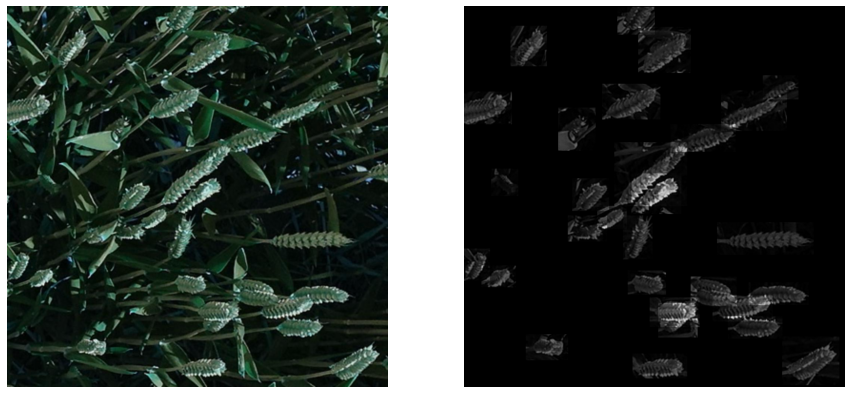

In [28]:
class_ids = [0]

while class_ids[0] == 0:  ## look for a mask
    image_id = random.choice(dataset_train.image_ids)
    image_fp = dataset_train.image_reference(image_id)
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)

print(image.shape)

plt.figure(figsize=(15, 15))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
masked = np.zeros(image.shape[:2])
for i in range(mask.shape[2]):
    masked += image[:, :, 0] * mask[:, :, i]
plt.imshow(masked, cmap='gray')
plt.axis('off')

print(class_ids)
plt.show()

Original shape:  (1024, 1024, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 72)      min:    0.00000  max:    1.00000  bool
class_ids                shape: (72,)                 min:    1.00000  max:    1.00000  int32
bbox                     shape: (72, 4)               min:    0.00000  max: 1024.00000  int32


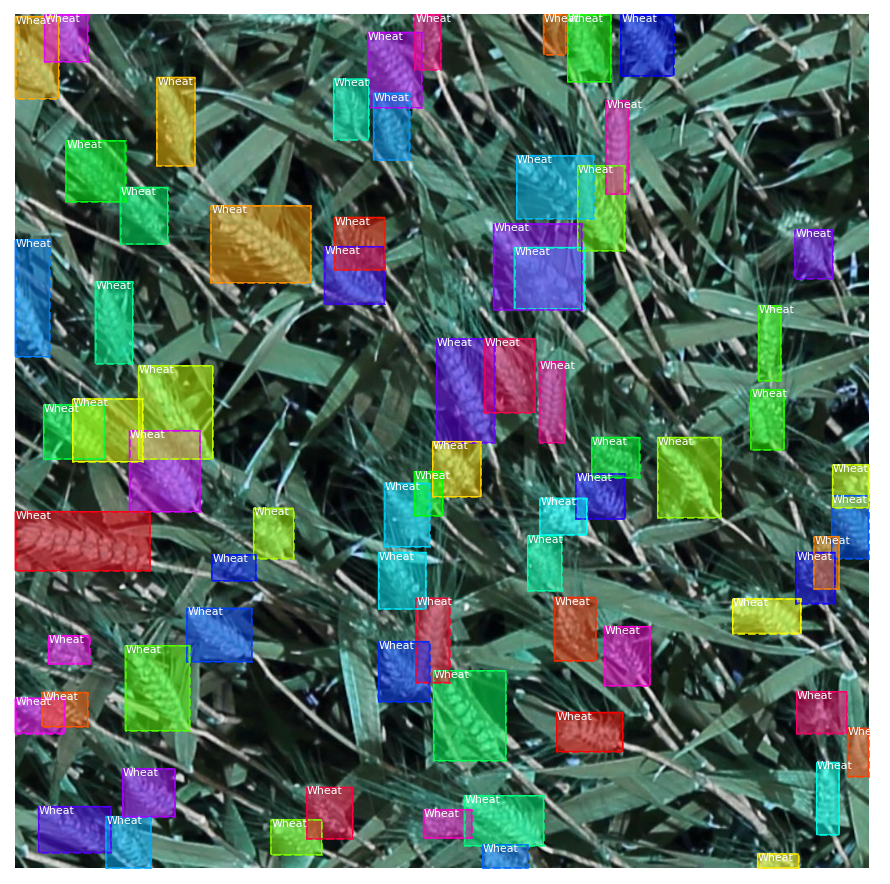

In [29]:
# Load random image and mask.
image_id = np.random.choice(dataset_train.image_ids, 1)[0]
image = dataset_train.load_image(image_id)
mask, class_ids = dataset_train.load_mask(image_id)
original_shape = image.shape

# Resize
image, window, scale, padding, _ = utils.resize_image(image, 
                                                      min_dim=config.IMAGE_MIN_DIM, 
                                                      max_dim=config.IMAGE_MAX_DIM,
                                                      mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)

# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)

# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, 
                            dataset_train.class_names)

In [0]:
import warnings
from imgaug import augmenters as iaa
warnings.filterwarnings("ignore")

augmentation = iaa.Sequential([
        iaa.OneOf([ ## rotate
            iaa.Affine(rotate=0),
            iaa.Affine(rotate=90),
            iaa.Affine(rotate=180),
            iaa.Affine(rotate=270),
        ]),

        iaa.Fliplr(0.5),
        iaa.Flipud(0.2),

        iaa.OneOf([ # drop out augmentation
            iaa.Cutout(fill_mode="constant", cval=255),
            iaa.CoarseDropout((0.0, 0.05), size_percent=(0.02, 0.25)),
            ]),

        iaa.OneOf([ ## weather augmentation
            iaa.Snowflakes(flake_size=(0.2, 0.4), speed=(0.01, 0.07)),
            iaa.Rain(speed=(0.3, 0.5)),
        ]),  

        iaa.OneOf([ ## brightness or contrast
            iaa.Multiply((0.8, 1.0)),
            iaa.contrast.LinearContrast((0.9, 1.1)),
        ]),

        iaa.OneOf([ ## blur or sharpen
            iaa.GaussianBlur(sigma=(0.0, 0.1)),
            iaa.Sharpen(alpha=(0.0, 0.1)),
        ])
    ],
    # do all of the above augmentations in random order
    random_order=True
)

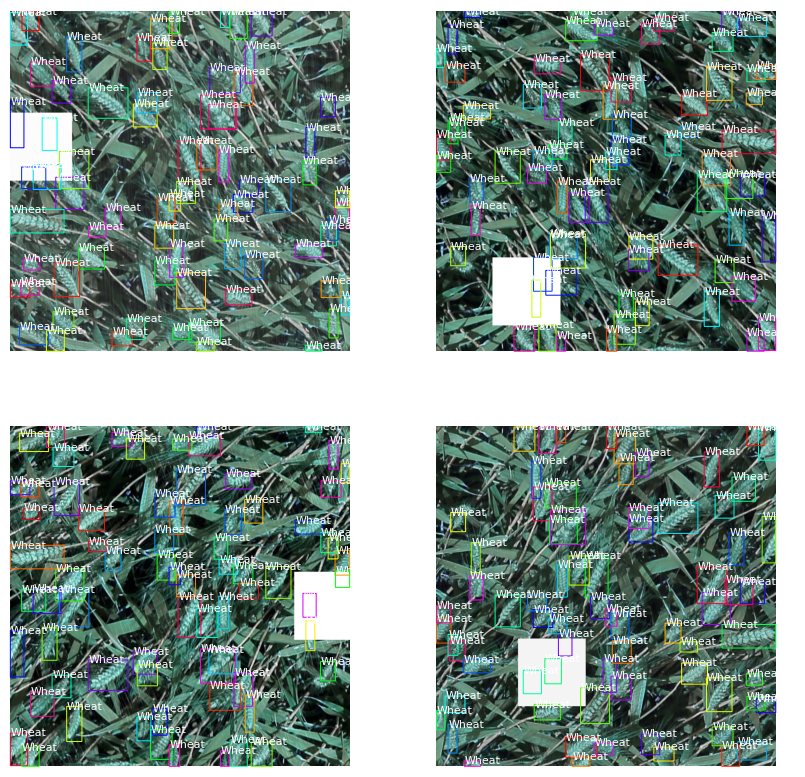

In [31]:
# from official repo
def get_ax(rows=1, cols=1, size=7):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


# Load the image multiple times to show augmentations
limit = 4
ax = get_ax(rows=2, cols=limit//2)

for i in range(limit):
    image, image_meta, class_ids,\
    bbox, mask = modellib.load_image_gt(
        dataset_train, config, image_id, use_mini_mask=False, 
        augment=False, augmentation=augmentation)
    
    visualize.display_instances(image, bbox, mask, class_ids,
                                dataset_train.class_names, ax=ax[i//2, i % 2],
                                show_mask=False, show_bbox=False)


In [32]:
def model_definition():
    print("loading mask R-CNN model")
    model = modellib.MaskRCNN(mode='training', 
                              config=config, 
                              model_dir=packages_root)
    
    # load the weights for COCO
    model.load_weights('/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/Models/mask_rcnn_coco.h5',
                       by_name=True, 
                       exclude=["mrcnn_class_logits",
                                "mrcnn_bbox_fc",  
                                "mrcnn_bbox","mrcnn_mask"])
    return model   

model = model_definition()

loading mask R-CNN model






Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
box_ind is deprecated, use box_indices instead








In [0]:
from keras.callbacks import (ModelCheckpoint, ReduceLROnPlateau, CSVLogger)

def callback():
    cb = []
    checkpoint = ModelCheckpoint(packages_root+'wheat_wg.h5',
                                 save_best_only=True,
                                 mode='min',
                                 monitor='val_loss',
                                 save_weights_only=True, verbose=1)
    cb.append(checkpoint)
    reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss',
                                   factor=0.3, patience=5,
                                   verbose=1, mode='auto',
                                   epsilon=0.0001, cooldown=1, min_lr=0.00001)
    log = CSVLogger(packages_root+'wheat_history.csv')
    cb.append(log)
    cb.append(reduceLROnPlat)
    return cb

In [34]:
%%time
CB = callback()
TRAIN = True

class WheatInferenceConfig(WheatDetectorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

if TRAIN:
    model.train(dataset_train, dataset_valid, 
                augmentation=augmentation, 
                learning_rate=config.LEARNING_RATE,
                custom_callbacks = CB,
                epochs=epoch, layers='all') 
else:
    inference_config = WheatInferenceConfig()
    # Recreate the model in inference mode
    model = modellib.MaskRCNN(mode='inference', 
                              config=inference_config,
                              model_dir=packages_root)
    
    model.load_weights('/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/Models/wheat_wg.h5', 
                       by_name = True)


Starting at epoch 0. LR=0.005

Checkpoint Path: /content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/Models/wheat20200612T1143/mask_rcnn_wheat_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (Batch

In [37]:
history = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/Modelswheat_history.csv') 

# find the lowest validation loss score
print(history.loc[history['val_loss'].idxmin()])
history.head()

epoch                   49.000000
loss                     1.011165
mrcnn_bbox_loss          0.217650
mrcnn_class_loss         0.252613
mrcnn_mask_loss          0.292958
rpn_bbox_loss            0.216852
rpn_class_loss           0.031043
val_loss                 0.939377
val_mrcnn_bbox_loss      0.201862
val_mrcnn_class_loss     0.251247
val_mrcnn_mask_loss      0.277831
val_rpn_bbox_loss        0.185806
val_rpn_class_loss       0.022583
Name: 49, dtype: float64


,epoch,loss,mrcnn_bbox_loss,mrcnn_class_loss,mrcnn_mask_loss,rpn_bbox_loss,rpn_class_loss,val_loss,val_mrcnn_bbox_loss,val_mrcnn_class_loss,val_mrcnn_mask_loss,val_rpn_bbox_loss,val_rpn_class_loss
0,0,1.688400,0.387519,0.410769,0.361023,0.410659,0.118391,1.361614,0.242640,0.381084,0.279092,0.339278,0.119481
1,1,1.402155,0.296503,0.360699,0.314336,0.366633,0.063946,1.529457,0.268263,0.348725,0.314917,0.478395,0.119120
2,2,1.348806,0.283573,0.359672,0.319706,0.334607,0.051209,1.641586,0.288952,0.355900,0.336629,0.560654,0.099413
3,3,1.404031,0.306910,0.365092,0.333898,0.339902,0.058191,1.304814,0.287242,0.315832,0.339763,0.311565,0.050373
4,4,1.300911,0.280947,0.354088,0.316839,0.303813,0.045185,1.280668,0.296989,0.354286,0.285049,0.293946,0.050358


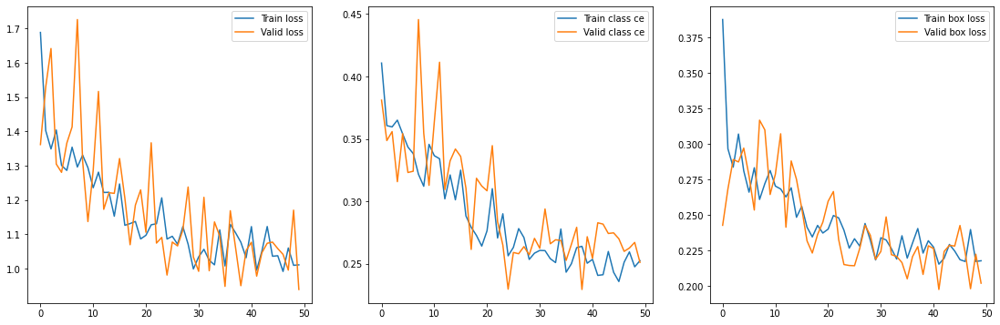

In [38]:
plt.figure(figsize=(19,6))

plt.subplot(131)
plt.plot(history.epoch, history.loss, label="Train loss")
plt.plot(history.epoch, history.val_loss, label="Valid loss")
plt.legend()

plt.subplot(132)
plt.plot(history.epoch, history.mrcnn_class_loss, label="Train class ce")
plt.plot(history.epoch, history.val_mrcnn_class_loss, label="Valid class ce")
plt.legend()

plt.subplot(133)
plt.plot(history.epoch, history.mrcnn_bbox_loss, label="Train box loss")
plt.plot(history.epoch, history.val_mrcnn_bbox_loss, label="Valid box loss")
plt.legend()

plt.show()

In [46]:
inference_config = WheatInferenceConfig()
    # Recreate the model in inference mode
model = modellib.MaskRCNN(mode='inference', 
                              config=inference_config,
                              model_dir=packages_root)
    
model.load_weights('/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/Modelswheat_wg.h5', by_name = True)



Instructions for updating:
Use `tf.cast` instead.


Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.17695  max:    1.11439  float32
image_meta               shape: (14,)                 min:    0.00000  max: 1024.00000  int64
gt_class_id              shape: (51,)                 min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (51, 4)               min:    0.00000  max: 1024.00000  int32
gt_mask                  shape: (1024, 1024, 51)      min:    0.00000  max:    1.00000  bool
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas    

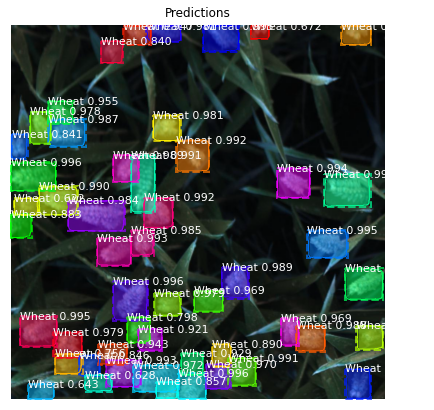

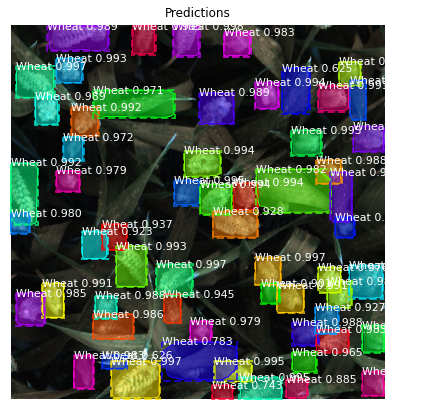

In [66]:
image_id = np.random.choice(dataset_valid.image_ids, 2)

for img_id in image_id:
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_valid, inference_config,     
                               img_id, use_mini_mask=False)

    info = dataset_valid.image_info[img_id]
    results = model.detect([original_image], verbose=1)
    r = results[0]

    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                dataset_valid.class_names, r['scores'], ax=get_ax(), title="Predictions")
    
    log("image_meta", image_meta)
    log("gt_class_id", gt_class_id)
    log("gt_bbox", gt_bbox)
    log("gt_mask", gt_mask)

In [0]:
def get_jpg(img_dir):
    jpg_fps = glob.glob(img_dir + '*.jpg')
    return list(set(jpg_fps))

# Get filenames of test dataset jpg images
test_img_root  = '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/test/'
test_image_fps = get_jpg(test_img_root)

In [64]:
test_image_fps

['/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/test/53f253011.jpg',
 '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/test/796707dd7.jpg',
 '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/test/348a992bb.jpg',
 '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/test/cb8d261a3.jpg',
 '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/test/aac893a91.jpg',
 '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/test/f5a1f0358.jpg',
 '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/test/51f1be19e.jpg',
 '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/test/2fd875eaa.jpg',
 '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/test/51b3e36ab.jpg',
 '/content/drive/My Drive/Colab Notebooks/Wheat Head Count Project/Data/test/cc3532ff6.jpg']

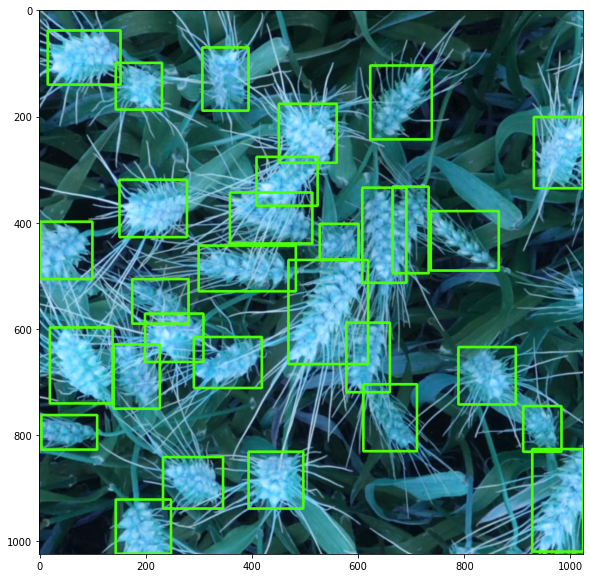

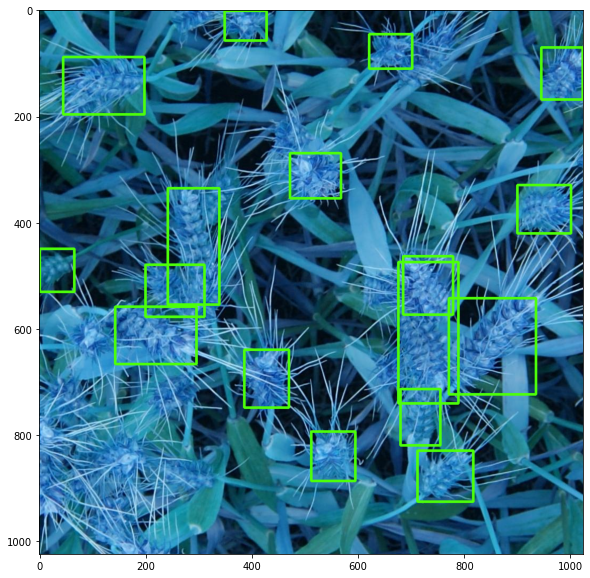

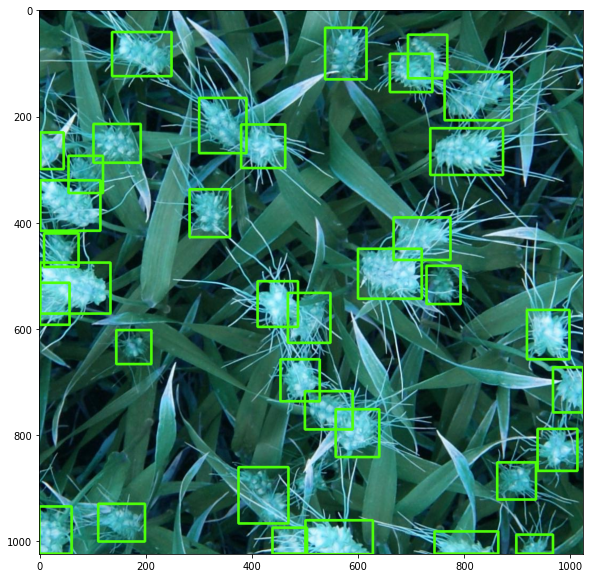

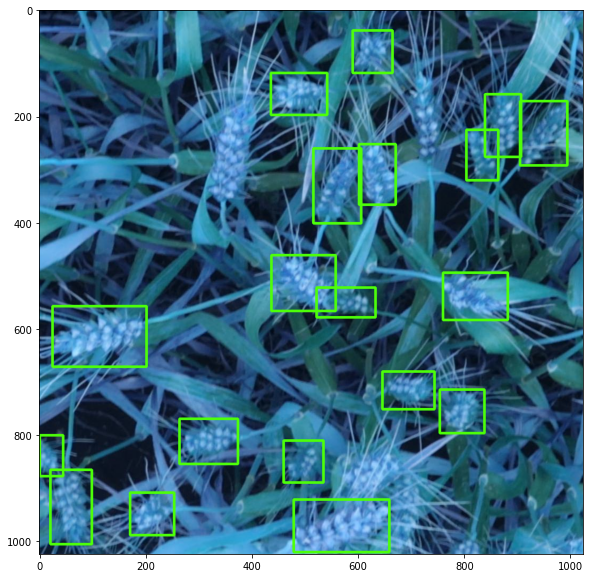

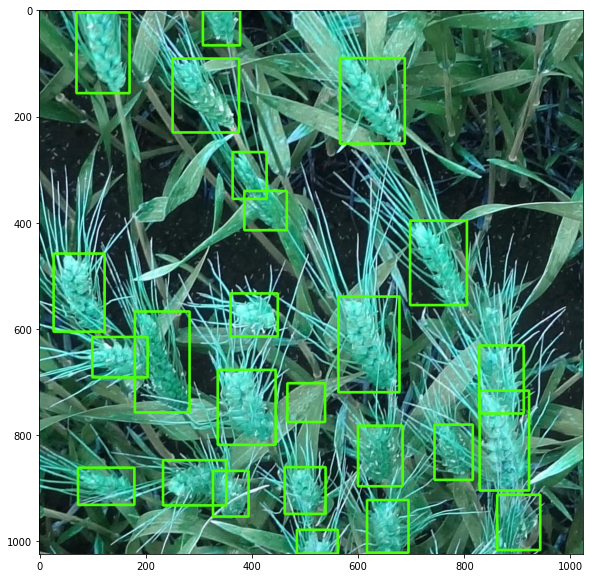

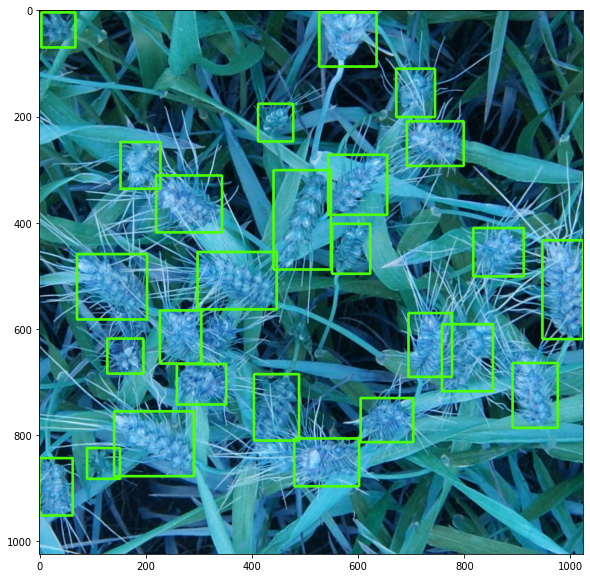

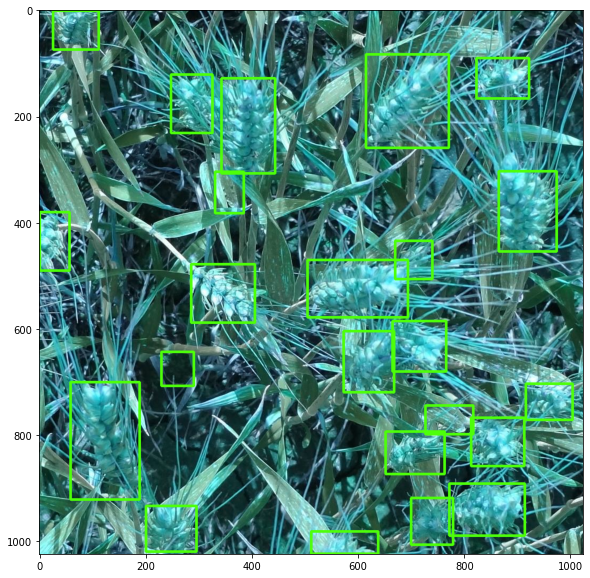

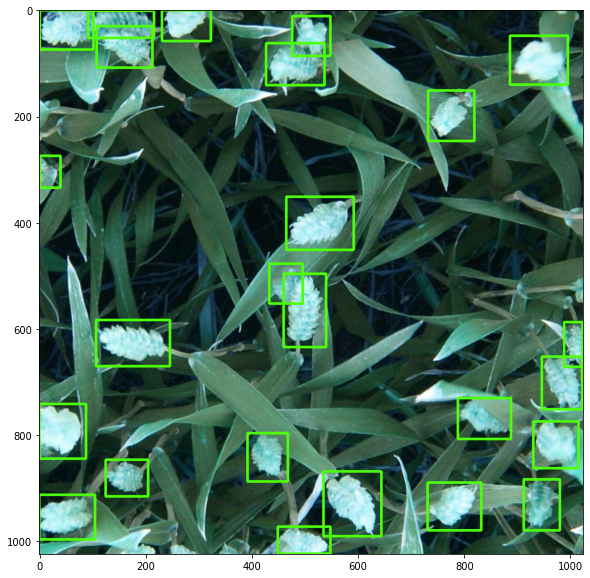

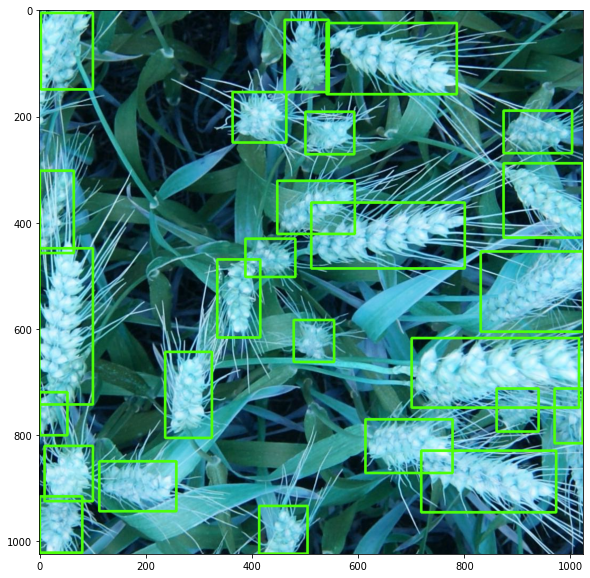

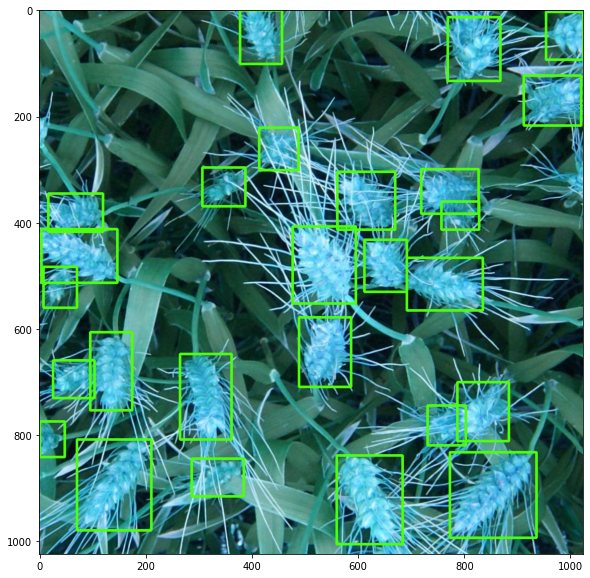

In [65]:
# show a few test image detection example
for image_id in test_image_fps:
    image = cv2.imread(image_id, cv2.IMREAD_COLOR)

    # assume square image 
    resize_factor = ORIG_SIZE / config.IMAGE_SHAPE[0]

    # If grayscale. Convert to RGB for consistency.
    if len(image.shape) != 3 or image.shape[2] != 3:
        image = np.stack((image,) * 3, -1) 

    resized_image, window, scale, padding, crop = utils.resize_image(
        image,
        min_dim=config.IMAGE_MIN_DIM,
        min_scale=config.IMAGE_MIN_SCALE,
        max_dim=config.IMAGE_MAX_DIM,
        mode=config.IMAGE_RESIZE_MODE)

    image_id = os.path.splitext(os.path.basename(image_id))[0]

    results = model.detect([resized_image])
    r = results[0]
    for bbox in r['rois']: 
        x1 = int(bbox[1] * resize_factor)
        y1 = int(bbox[0] * resize_factor)
        x2 = int(bbox[3] * resize_factor)
        y2 = int(bbox[2] * resize_factor)
        cv2.rectangle(image, (x1,y1), (x2,y2), (77, 255, 9), 3, 1)
        width  = x2 - x1 
        height = y2 - y1 

    plt.figure(figsize=(10,10)) 
    plt.grid(False)
    plt.imshow(image, cmap=plt.cm.gist_gray)